In [1]:
import face_recognition as fr
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
from keras.models import Model as KerasModel
from keras.layers import Input, Dense,Flatten, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Reshape, Concatenate, LeakyReLU
from keras.optimizers import Adam
import time
import math

In [2]:
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
font_face = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 2e-3  # Adjust for larger font size in all images
THICKNESS_SCALE = 4e-3  # Adjust for larger thickness in all images

In [4]:
def get_frames(filename):
    frames = []
    cap = cv2.VideoCapture(filename)

    while(cap.isOpened()):
        ret, frame = cap.read()
                
        if not ret:
            break;
            
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(image)

    cap.release()
    cv2.destroyAllWindows()
    return frames

In [5]:
frames = get_frames('video/a6 2-1-Animated.mp4')

In [6]:
len(frames)

348

In [7]:
#fr.face_encodings(frames[0])

In [8]:
start = time.time()
frames_enc = [fr.face_encodings(frames[i]) for i in range(len(frames))]
end = time.time()
print(end - start)

209.23489046096802


In [10]:
def get_similarity_scores(frames):
   
    scores = []
    for i in range(1, len(frames)):
        #frame = frames[i]
        #prev_frame = frames[i-1]
        
        score = fr.face_distance(frames[i-1],frames[i][0])
        
        #(score, diff) = compare_ssim(frame, prev_frame, full=True, multichannel=True)
        scores.append(score[0])
    return scores

In [11]:
score = get_similarity_scores(frames_enc)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


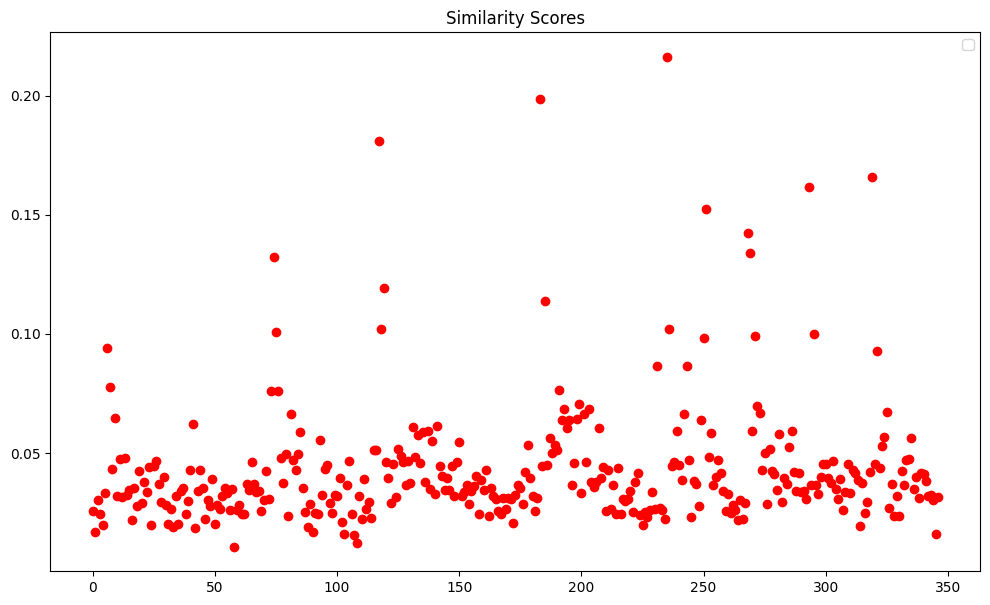

In [12]:
plt.figure(figsize=(12,7))
    
plt.plot(get_similarity_scores(frames_enc), "or")

plt.legend()
plt.title('Similarity Scores')
plt.show()

In [13]:
IMGWIDTH = 256


class Classifier:
    def __init__():
        self.model = 0
    
    def predict(self, x):
        if x.size == 0:
            return []
        return self.model.predict(x)
    
    def fit(self, x, y):
        return self.model.train_on_batch(x, y)
    
    def get_accuracy(self, x, y):
        return self.model.test_on_batch(x, y)
    
    def load(self, path):
        self.model.load_weights(path)
        
    
    
class Meso4(Classifier):
    def __init__(self, learning_rate = 0.001):
        self.model = self.init_model()
        optimizer = Adam(lr = learning_rate)
        self.model.compile(optimizer = optimizer, loss = 'mean_squared_error', metrics = ['accuracy'])
    
    def init_model(self): 
        x = Input(shape = (IMGWIDTH, IMGWIDTH, 3))
        
        x1 = Conv2D(8, (3, 3), padding='same', activation = 'relu')(x)
        x1 = BatchNormalization()(x1)
        x1 = MaxPooling2D(pool_size=(2, 2), padding='same')(x1)
        
        x2 = Conv2D(8, (5, 5), padding='same', activation = 'relu')(x1)
        x2 = BatchNormalization()(x2)
        x2 = MaxPooling2D(pool_size=(2, 2), padding='same')(x2)
        
        x3 = Conv2D(16, (5, 5), padding='same', activation = 'relu')(x2)
        x3 = BatchNormalization()(x3)
        x3 = MaxPooling2D(pool_size=(2, 2), padding='same')(x3)
        
        x4 = Conv2D(16, (5, 5), padding='same', activation = 'relu')(x3)
        x4 = BatchNormalization()(x4)
        x4 = MaxPooling2D(pool_size=(4, 4), padding='same')(x4)
        
        y = Flatten()(x4)
        y = Dropout(0.5)(y)
        y = Dense(16)(y)
        y = LeakyReLU(alpha=0.1)(y)
        y = Dropout(0.5)(y)
        y = Dense(1, activation = 'sigmoid')(y)

        return KerasModel(inputs = x, outputs = y)
    
class MesoInception4(Classifier):
    def __init__(self, learning_rate = 0.001):
        self.model = self.init_model()
        optimizer = Adam(lr = learning_rate)
        self.model.compile(optimizer = optimizer, loss = 'mean_squared_error', metrics = ['accuracy'])
    
    def InceptionLayer(self, a, b, c, d):
        def func(x):
            x1 = Conv2D(a, (1, 1), padding='same', activation='relu')(x)
            
            x2 = Conv2D(b, (1, 1), padding='same', activation='relu')(x)
            x2 = Conv2D(b, (3, 3), padding='same', activation='relu')(x2)
            
            x3 = Conv2D(c, (1, 1), padding='same', activation='relu')(x)
            x3 = Conv2D(c, (3, 3), dilation_rate = 2, strides = 1, padding='same', activation='relu')(x3)
            
            x4 = Conv2D(d, (1, 1), padding='same', activation='relu')(x)
            x4 = Conv2D(d, (3, 3), dilation_rate = 3, strides = 1, padding='same', activation='relu')(x4)

            y = Concatenate(axis = -1)([x1, x2, x3, x4])
            
            return y
        return func
    
    def init_model(self):
        x = Input(shape = (IMGWIDTH, IMGWIDTH, 3))
        
        x1 = self.InceptionLayer(1, 4, 4, 2)(x)
        x1 = BatchNormalization()(x1)
        x1 = MaxPooling2D(pool_size=(2, 2), padding='same')(x1)
        
        x2 = self.InceptionLayer(2, 4, 4, 2)(x1)
        x2 = BatchNormalization()(x2)
        x2 = MaxPooling2D(pool_size=(2, 2), padding='same')(x2)        
        
        x3 = Conv2D(16, (5, 5), padding='same', activation = 'relu')(x2)
        x3 = BatchNormalization()(x3)
        x3 = MaxPooling2D(pool_size=(2, 2), padding='same')(x3)
        
        x4 = Conv2D(16, (5, 5), padding='same', activation = 'relu')(x3)
        x4 = BatchNormalization()(x4)
        x4 = MaxPooling2D(pool_size=(4, 4), padding='same')(x4)
        
        y = Flatten()(x4)
        y = Dropout(0.5)(y)
        y = Dense(16)(y)
        y = LeakyReLU(alpha=0.1)(y)
        y = Dropout(0.5)(y)
        y = Dense(1, activation = 'sigmoid')(y)

        return KerasModel(inputs = x, outputs = y)
    

In [15]:
MesoNet_classifier = Meso4()
MesoNet_classifier.load("Meso4_DF")

In [16]:
def get_boundingbox(x1,y1,x2,y2, width, height, scale=1.3, minsize=None):
    """
    based on get_boundingbox method of Andreas Rössler
    Expects a dlib face to generate a quadratic bounding box.
    :param x1 - coordnate from face_recognition get_location 
    :param y1 - coordnate from face_recognition get_location
    :param x2 - coordnate from face_recognition get_location
    :param y2 - coordnate from face_recognition get_location
    :param width: frame width
    :param height: frame height
    :param scale: bounding box size multiplier to get a bigger face region
    :param minsize: set minimum bounding box size
    :return: x, y, bounding_box_size in opencv form
    """

    size_bb = int(max(x2 - x1, y2 - y1) * scale)
    if minsize:
        if size_bb < minsize:
            size_bb = minsize
    center_x, center_y = (x1 + x2) // 2, (y1 + y2) // 2

    # Check for out of bounds, x-y top left corner
    x1 = max(int(center_x - size_bb // 2), 0)
    y1 = max(int(center_y - size_bb // 2), 0)
    # Check for too big bb size for given x, y
    size_bb = min(width - x1, size_bb)
    size_bb = min(height - y1, size_bb)

    return x1, y1, size_bb

In [17]:
def predict_meso(image,model, with_face_location=True):
    """
    Predict and give result as numpy array
    """
    
    prediction = []
    cropped_face=image
    if with_face_location:             
        faces = fr.face_locations(image)       
        height, width = image.shape[:2]
        if len(faces):
        # For now only take biggest face
            top, right, bottom, left = faces[0]        
            x1,y1,size_bb = get_boundingbox(left,top,right,bottom,width,height)
            
            cropped_face = image[y1:y1+size_bb, x1:x1+size_bb]

    res = cv2.resize(cropped_face, dsize=(256, 256), interpolation=cv2.INTER_AREA)
    res= res/255.0
    img_array=np.array([res])
    #print(img_array.shape)
    probabilistic_predictions = model.predict(img_array)             
    
        # ------------------------------------------------------------------
        
    return probabilistic_predictions, cropped_face

In [18]:
def predict_model_with_mesonet_on_video(video_fn,model, true_label,
                  start_frame=0, end_frame=30,
                  plot_every_x_frames = 5):
    """
    Given a video and model, starting frame and end frame.
    Predict on all frames.
    
    """
   
    video_path = video_fn
    print(video_path)
    frames = get_frames(video_path)
    print(len(frames))
    fig, axes = plt.subplots(3, 2, figsize=(20, 15))
    axes =  axes.flatten()
    x, y = 10, 40   
    counter = start_frame
    i=0
    for frame in frames[start_frame:end_frame]:
                
        if counter % plot_every_x_frames == 0:
            if i>=6:
                break
            prediction, fimg = predict_meso(frame, model, with_face_location=True)
            height, width, _ = fimg.shape

            font_scale = min(width, height) * FONT_SCALE
            thickness = math.ceil(min(width, height) * THICKNESS_SCALE)
            prediction = prediction[0][0]
            label = 'real' if prediction >=0.5 else "fake"
            color = (0, 255, 0) if prediction >= 0.5 else (0, 0, 255)
            text =  str(prediction)+'=>'+label
            cv2.putText(fimg, text, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
            textsize = cv2.getTextSize(text, font_face, font_scale, thickness)[0]   
            axes[i].imshow(fimg)
            true_label_text = "real" if  true_label else "fake"
            axes[i].set_title(f'frame {i} - true label: {true_label_text}')
            axes[i].xaxis.set_visible(False)
            axes[i].yaxis.set_visible(False)
            i+=1
        counter+=1    
        
    #plt.tight_layout()
    plt.show()

video/fake1.mp4
300
1/1 [==============================] - 0s 20ms/step


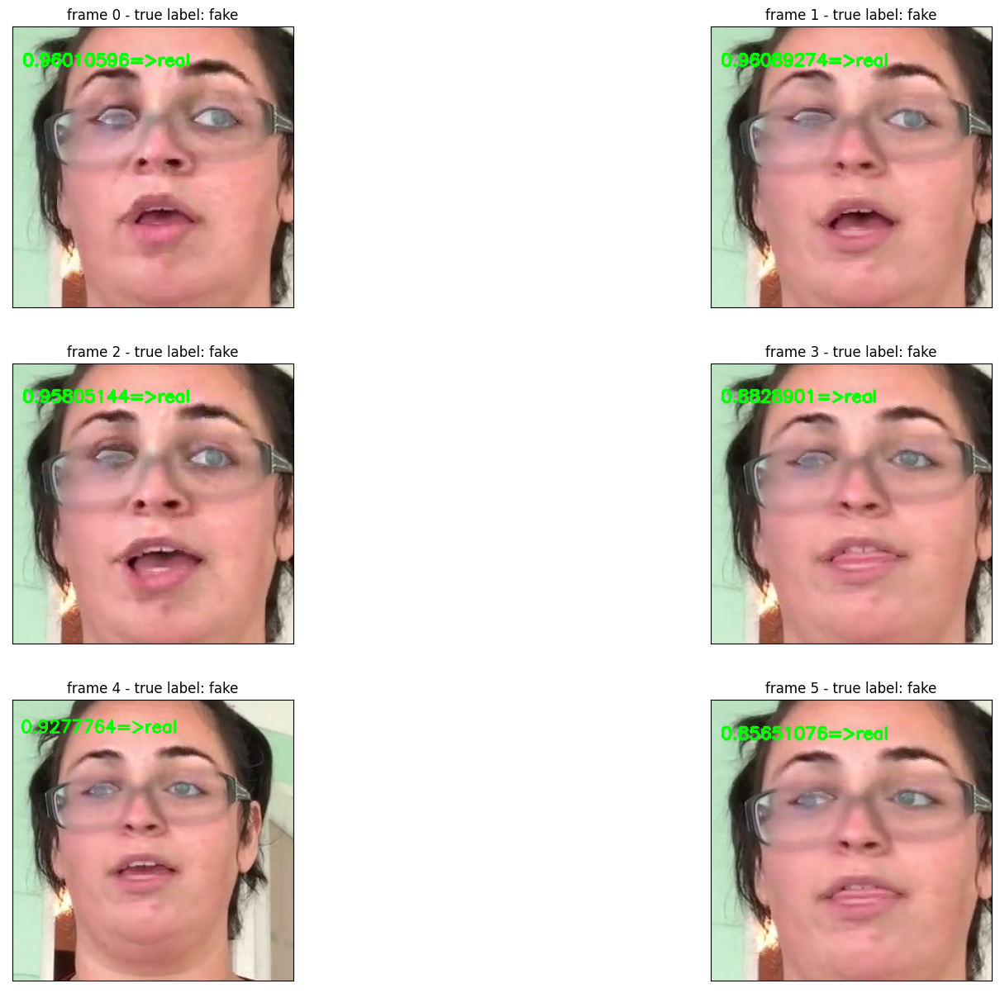

In [19]:
predict_model_with_mesonet_on_video("video/fake1.mp4",MesoNet_classifier,False)

video/real1.mp4
300
1/1 [==============================] - 0s 20ms/step


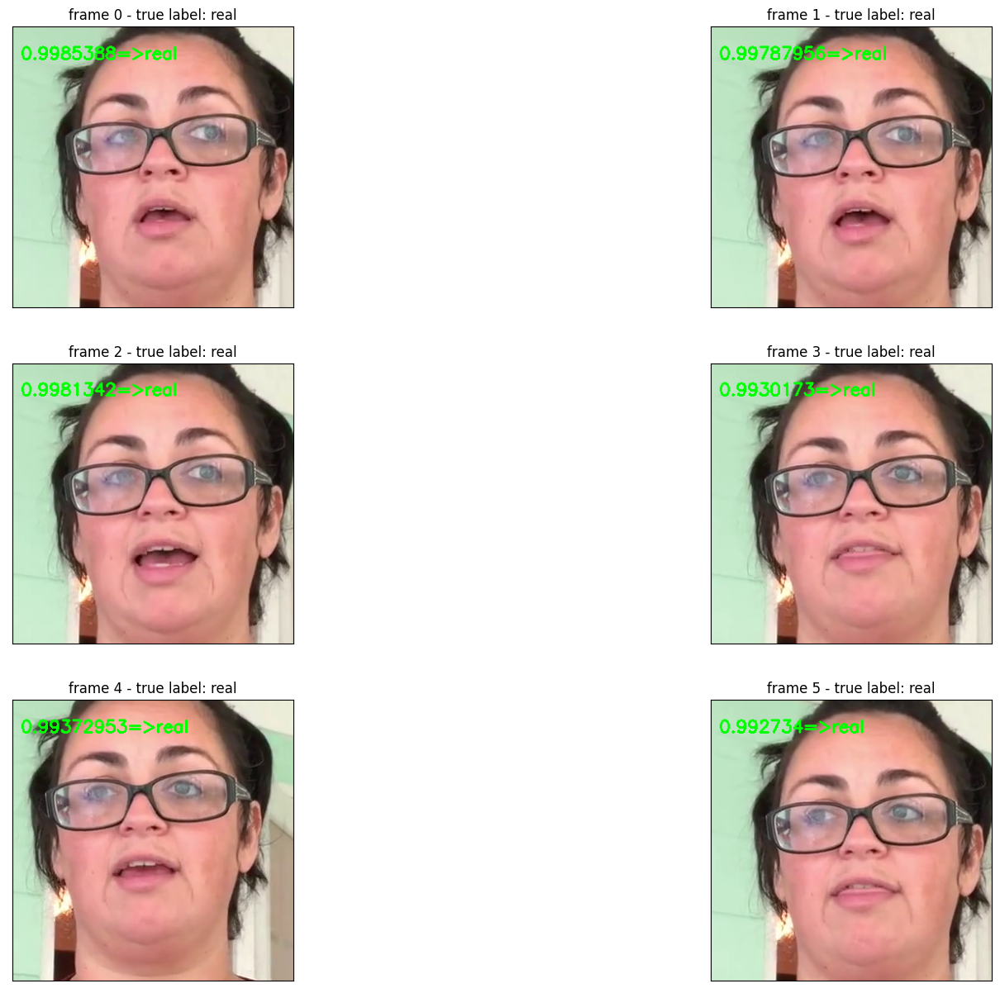

In [20]:
predict_model_with_mesonet_on_video("video/real1.mp4",MesoNet_classifier,True)

video/a6 2-1-Animated.mp4
348
1/1 [==============================] - 0s 20ms/step


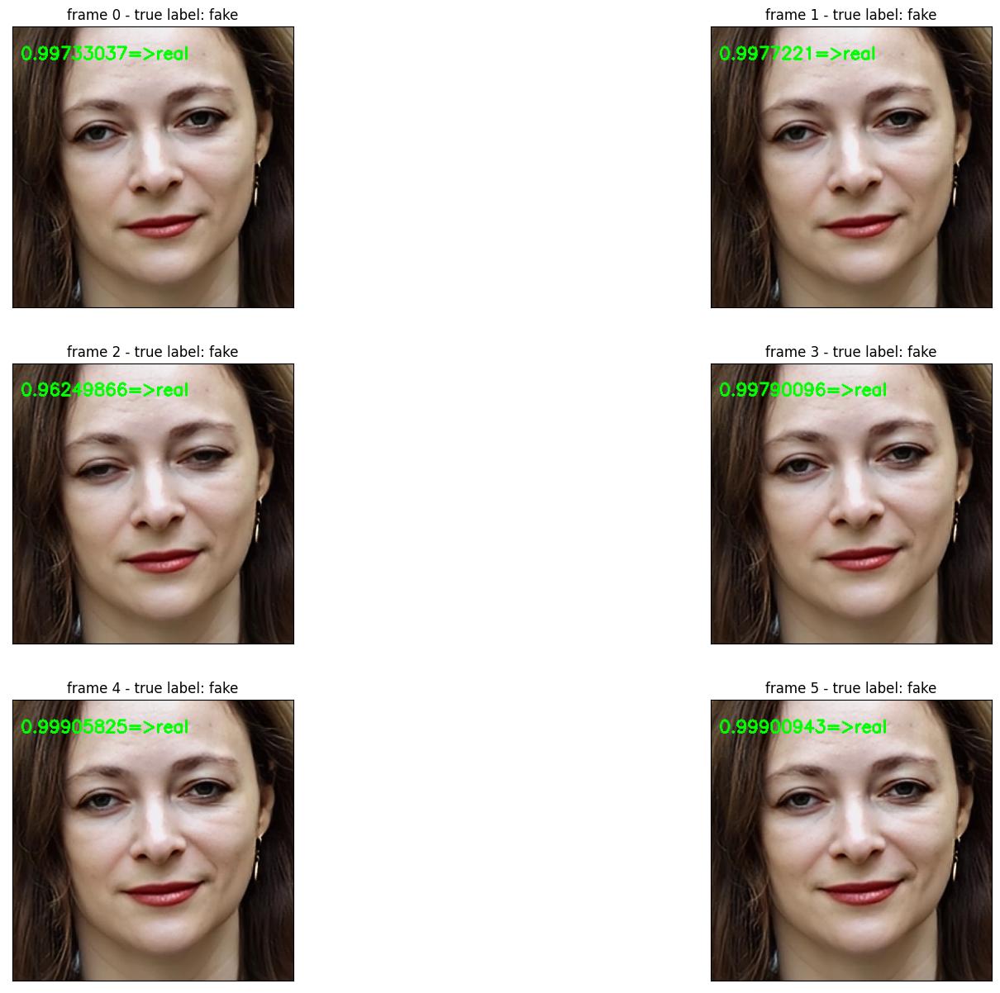

In [21]:
predict_model_with_mesonet_on_video("video/a6 2-1-Animated.mp4", MesoNet_classifier,False)

In [22]:
def predict_model_with_mesonet_for_images(model):
   
    files=[]
    for dirname, _, filenames in os.walk('images/images_for_tests/'):
        for filename in filenames:       
            files.append(dirname+filename)
   
    print(files)
    
    #fig, axes = plt.subplots(len(files)//2, 2, figsize=(20, 15))
    fig, axes = plt.subplots(3, 2, figsize=(20, 15))
    axes =  axes.flatten()
    x, y = 10, 40   
    
    
    i=0
    for file in files[-6:]:
        frame = cv2.imread(file)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
       
        prediction,fimg = predict_meso(frame, model,with_face_location=True)
        height, width, _ = fimg.shape

        font_scale = min(width, height) * FONT_SCALE
        thickness = math.ceil(min(width, height) * THICKNESS_SCALE)
        #print(prediction)
        if prediction==[]:
            prediction = 0
        else:
            prediction=prediction[0][0]      
        label = 'real' if prediction >=0.5 else "fake"
        color = (0, 255, 0) if prediction >= 0.5 else (255, 0, 0)
        text =  str(prediction)+'=>'+label
        cv2.putText(fimg, text, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
        textsize = cv2.getTextSize(text, font_face, font_scale, thickness)[0]   
        axes[i].imshow(fimg)
        true_label = "real" if "real" in file else "fake"
        axes[i].set_title(f'frame {i} - true label: {true_label}')
        axes[i].xaxis.set_visible(False)
        axes[i].yaxis.set_visible(False)
        i+=1
        
        
    plt.tight_layout()
    plt.show()

['images/images_for_tests/fake1.jpg', 'images/images_for_tests/fake2.jpg', 'images/images_for_tests/fake3.jpg', 'images/images_for_tests/fake4.jpg', 'images/images_for_tests/real1.jpg', 'images/images_for_tests/real2.jfif']
1/1 [==============================] - 0s 29ms/step


C:\Users\elinam\.conda\envs\nlp_cv\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


1/1 [==============================] - 0s 20ms/step


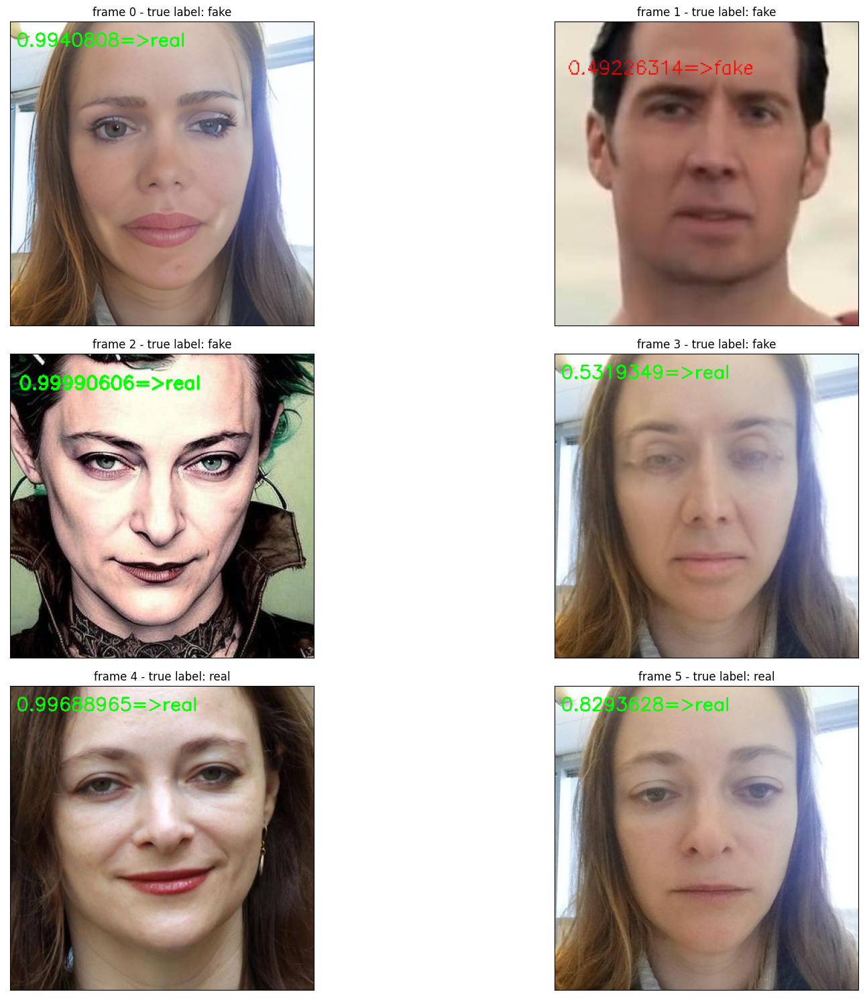

In [23]:
predict_model_with_mesonet_for_images(MesoNet_classifier)

In [24]:
MesoNet_classifier_mf = MesoInception4()
MesoNet_classifier_mf.load("faceforensics_models/faceforensics++_models_subset/face_detection/Meso/c40/all/weights.h5")

video/real1.mp4
300
1/1 [==============================] - 0s 37ms/step


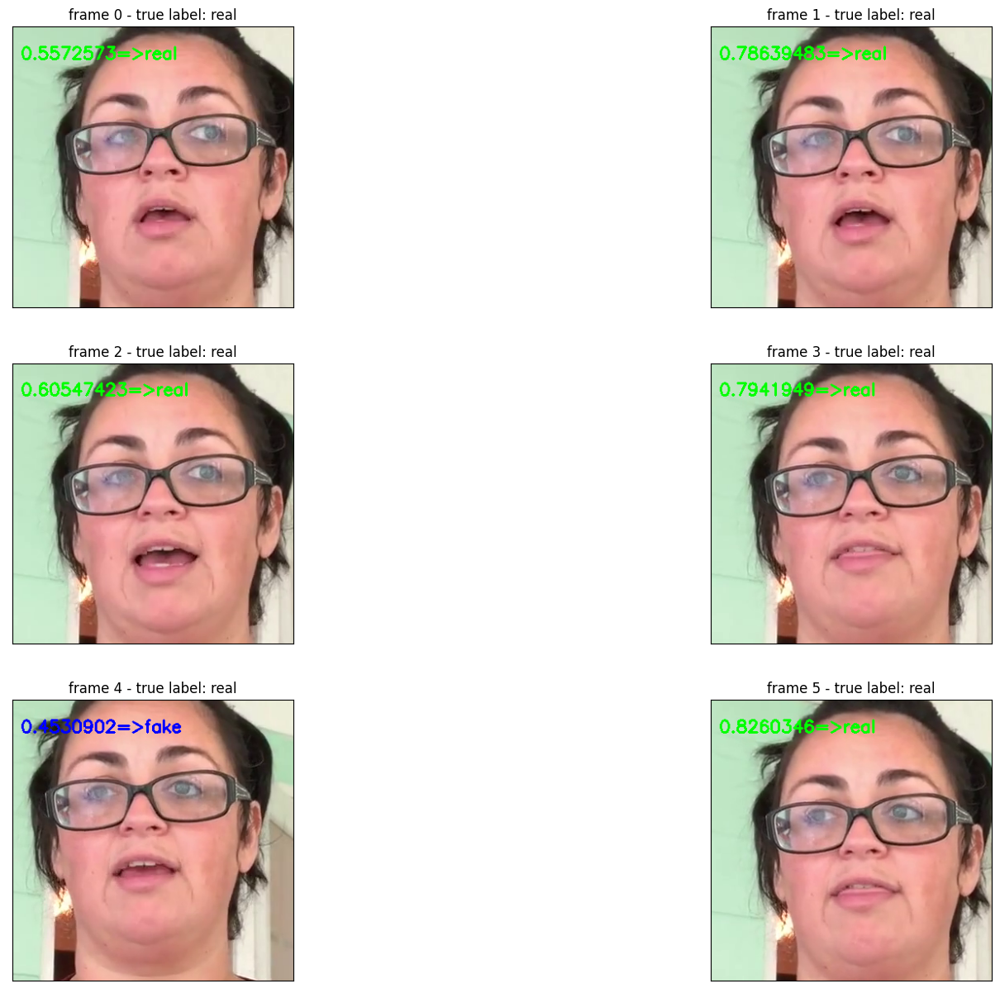

In [25]:
predict_model_with_mesonet_on_video("video/real1.mp4",MesoNet_classifier_mf,True)

video/fake1.mp4
300
1/1 [==============================] - 0s 41ms/step


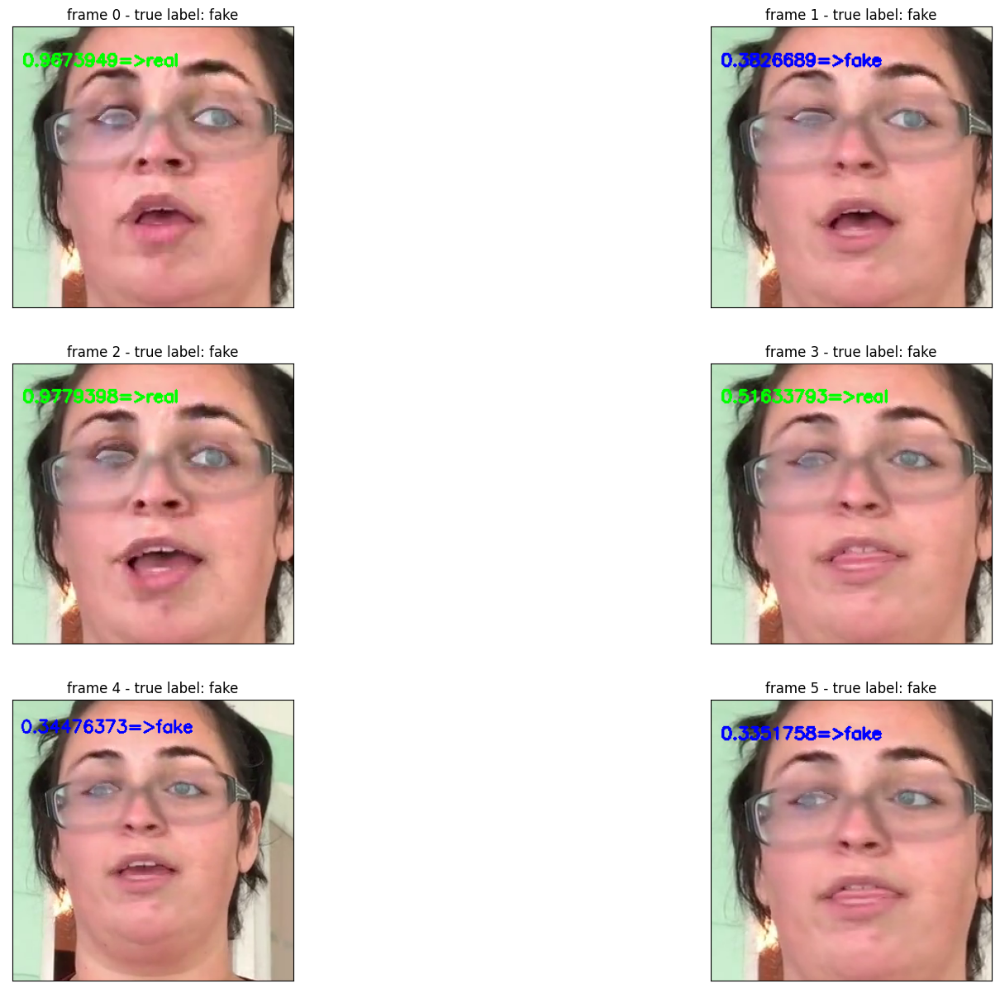

In [26]:
predict_model_with_mesonet_on_video("video/fake1.mp4",MesoNet_classifier_mf,False)

video/a6 2-1-Animated.mp4
348
1/1 [==============================] - 0s 39ms/step


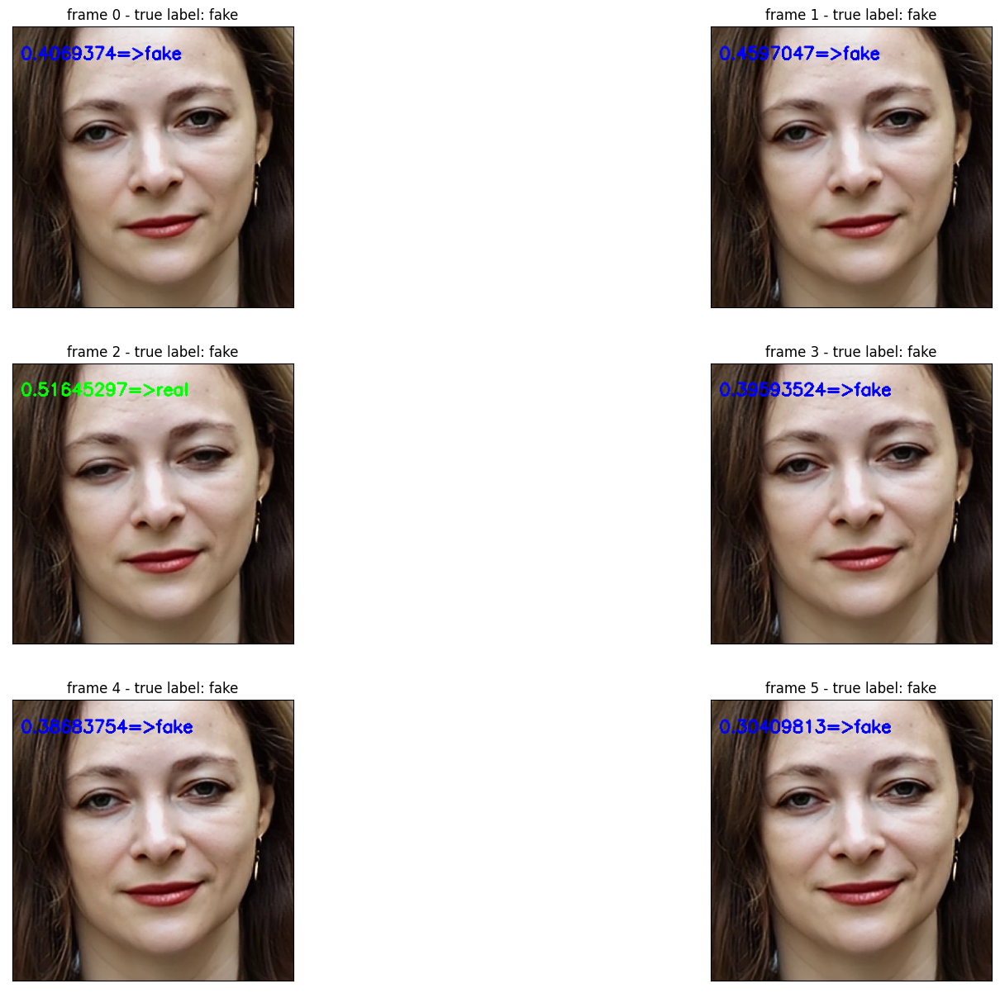

In [27]:
predict_model_with_mesonet_on_video("video/a6 2-1-Animated.mp4",MesoNet_classifier_mf,False)

['images/images_for_tests/fake1.jpg', 'images/images_for_tests/fake2.jpg', 'images/images_for_tests/fake3.jpg', 'images/images_for_tests/fake4.jpg', 'images/images_for_tests/real1.jpg', 'images/images_for_tests/real2.jfif']
1/1 [==============================] - 0s 43ms/step


C:\Users\elinam\.conda\envs\nlp_cv\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


1/1 [==============================] - 0s 30ms/step


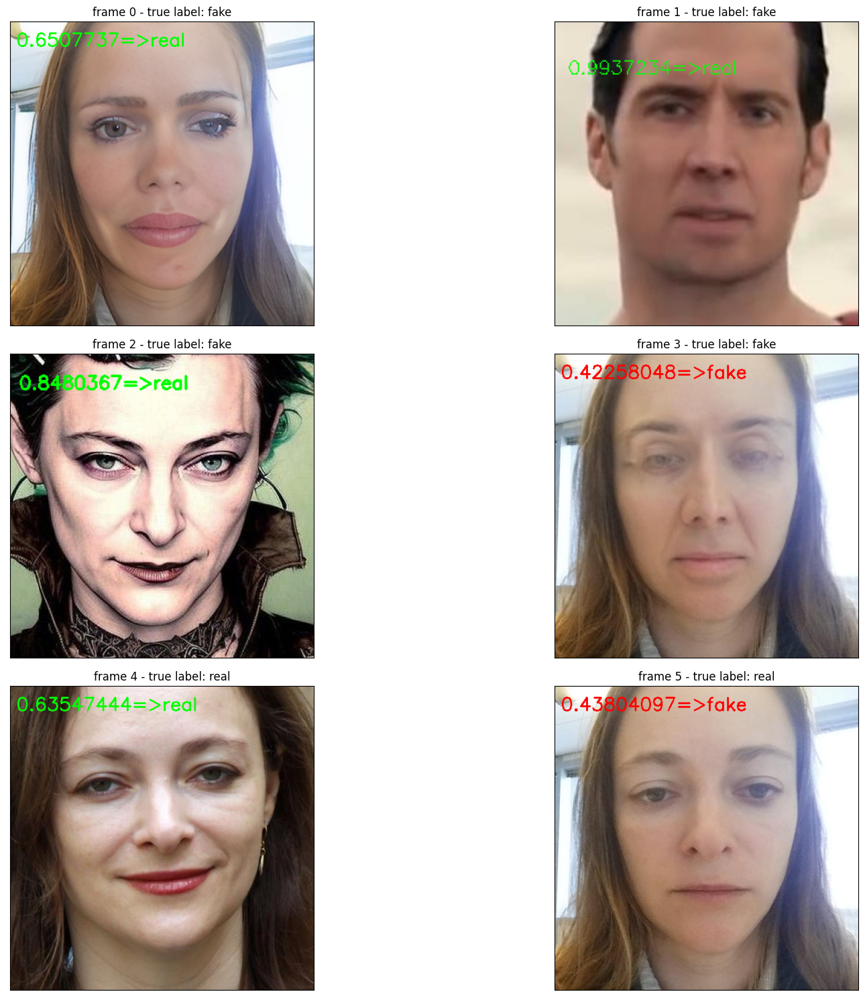

In [28]:
predict_model_with_mesonet_for_images(MesoNet_classifier_mf)

In [29]:
XCEPTION_MODEL = './xception-b5690688.pth'

In [30]:
## xception.py
"""
Ported to pytorch thanks to [tstandley](https://github.com/tstandley/Xception-PyTorch)
@author: tstandley
Adapted by cadene
Creates an Xception Model as defined in:
Francois Chollet
Xception: Deep Learning with Depthwise Separable Convolutions
https://arxiv.org/pdf/1610.02357.pdf
This weights ported from the Keras implementation. Achieves the following performance on the validation set:
Loss:0.9173 Prec@1:78.892 Prec@5:94.292
REMEMBER to set your image size to 3x299x299 for both test and validation
normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                  std=[0.5, 0.5, 0.5])
The resize parameter of the validation transform should be 333, and make sure to center crop at 299x299
"""
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo
from torch.nn import init

pretrained_settings = {
    'xception': {
        'imagenet': {
            'url': 'http://data.lip6.fr/cadene/pretrainedmodels/xception-b5690688.pth',
            'input_space': 'RGB',
            'input_size': [3, 299, 299],
            'input_range': [0, 1],
            'mean': [0.5, 0.5, 0.5],
            'std': [0.5, 0.5, 0.5],
            'num_classes': 1000,
            'scale': 0.8975 # The resize parameter of the validation transform should be 333, and make sure to center crop at 299x299
        }
    }
}


class SeparableConv2d(nn.Module):
    def __init__(self,in_channels,out_channels,kernel_size=1,stride=1,padding=0,dilation=1,bias=False):
        super(SeparableConv2d,self).__init__()

        self.conv1 = nn.Conv2d(in_channels,in_channels,kernel_size,stride,padding,dilation,groups=in_channels,bias=bias)
        self.pointwise = nn.Conv2d(in_channels,out_channels,1,1,0,1,1,bias=bias)

    def forward(self,x):
        x = self.conv1(x)
        x = self.pointwise(x)
        return x


class Block(nn.Module):
    def __init__(self,in_filters,out_filters,reps,strides=1,start_with_relu=True,grow_first=True):
        super(Block, self).__init__()

        if out_filters != in_filters or strides!=1:
            self.skip = nn.Conv2d(in_filters,out_filters,1,stride=strides, bias=False)
            self.skipbn = nn.BatchNorm2d(out_filters)
        else:
            self.skip=None

        self.relu = nn.ReLU(inplace=True)
        rep=[]

        filters=in_filters
        if grow_first:
            rep.append(self.relu)
            rep.append(SeparableConv2d(in_filters,out_filters,3,stride=1,padding=1,bias=False))
            rep.append(nn.BatchNorm2d(out_filters))
            filters = out_filters

        for i in range(reps-1):
            rep.append(self.relu)
            rep.append(SeparableConv2d(filters,filters,3,stride=1,padding=1,bias=False))
            rep.append(nn.BatchNorm2d(filters))

        if not grow_first:
            rep.append(self.relu)
            rep.append(SeparableConv2d(in_filters,out_filters,3,stride=1,padding=1,bias=False))
            rep.append(nn.BatchNorm2d(out_filters))

        if not start_with_relu:
            rep = rep[1:]
        else:
            rep[0] = nn.ReLU(inplace=False)

        if strides != 1:
            rep.append(nn.MaxPool2d(3,strides,1))
        self.rep = nn.Sequential(*rep)

    def forward(self,inp):
        x = self.rep(inp)

        if self.skip is not None:
            skip = self.skip(inp)
            skip = self.skipbn(skip)
        else:
            skip = inp

        x+=skip
        return x


class Xception(nn.Module):
    """
    Xception optimized for the ImageNet dataset, as specified in
    https://arxiv.org/pdf/1610.02357.pdf
    """
    def __init__(self, num_classes=1000):
        """ Constructor
        Args:
            num_classes: number of classes
        """
        super(Xception, self).__init__()
        self.num_classes = num_classes

        self.conv1 = nn.Conv2d(3, 32, 3,2, 0, bias=False)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(32,64,3,bias=False)
        self.bn2 = nn.BatchNorm2d(64)
        #do relu here

        self.block1=Block(64,128,2,2,start_with_relu=False,grow_first=True)
        self.block2=Block(128,256,2,2,start_with_relu=True,grow_first=True)
        self.block3=Block(256,728,2,2,start_with_relu=True,grow_first=True)

        self.block4=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block5=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block6=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block7=Block(728,728,3,1,start_with_relu=True,grow_first=True)

        self.block8=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block9=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block10=Block(728,728,3,1,start_with_relu=True,grow_first=True)
        self.block11=Block(728,728,3,1,start_with_relu=True,grow_first=True)

        self.block12=Block(728,1024,2,2,start_with_relu=True,grow_first=False)

        self.conv3 = SeparableConv2d(1024,1536,3,1,1)
        self.bn3 = nn.BatchNorm2d(1536)

        #do relu here
        self.conv4 = SeparableConv2d(1536,2048,3,1,1)
        self.bn4 = nn.BatchNorm2d(2048)

        self.fc = nn.Linear(2048, num_classes)

        # #------- init weights --------
        # for m in self.modules():
        #     if isinstance(m, nn.Conv2d):
        #         n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
        #         m.weight.data.normal_(0, math.sqrt(2. / n))
        #     elif isinstance(m, nn.BatchNorm2d):
        #         m.weight.data.fill_(1)
        #         m.bias.data.zero_()
        # #-----------------------------

    def features(self, input):
        x = self.conv1(input)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)
        x = self.block6(x)
        x = self.block7(x)
        x = self.block8(x)
        x = self.block9(x)
        x = self.block10(x)
        x = self.block11(x)
        x = self.block12(x)

        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu(x)

        x = self.conv4(x)
        x = self.bn4(x)
        return x

    def logits(self, features):
        x = self.relu(features)

        x = F.adaptive_avg_pool2d(x, (1, 1))
        x = x.view(x.size(0), -1)
        x = self.last_linear(x)
        return x

    def forward(self, input):
        x = self.features(input)
        x = self.logits(x)
        return x


def xception(num_classes=1000, pretrained='imagenet'):
    model = Xception(num_classes=num_classes)
    if pretrained:
        settings = pretrained_settings['xception'][pretrained]
        assert num_classes == settings['num_classes'], \
            "num_classes should be {}, but is {}".format(settings['num_classes'], num_classes)

        model = Xception(num_classes=num_classes)
        model.load_state_dict(model_zoo.load_url(settings['url']))

        model.input_space = settings['input_space']
        model.input_size = settings['input_size']
        model.input_range = settings['input_range']
        model.mean = settings['mean']
        model.std = settings['std']

    # TODO: ugly
    model.last_linear = model.fc
    del model.fc
    return model


In [31]:
## models.py
"""
Author: Andreas Rössler
"""
import os
import argparse


import torch
# import pretrainedmodels
import torch.nn as nn
import torch.nn.functional as F
# from network.xception import xception
import math
import torchvision


def return_pytorch04_xception(pretrained=True):
    # Raises warning "src not broadcastable to dst" but thats fine
    model = xception(pretrained=False)
    if pretrained:
        # Load model in torch 0.4+
        model.fc = model.last_linear
        del model.last_linear
        state_dict = torch.load(
            #'/home/ondyari/.torch/models/xception-b5690688.pth')
            XCEPTION_MODEL)
        for name, weights in state_dict.items():
            if 'pointwise' in name:
                state_dict[name] = weights.unsqueeze(-1).unsqueeze(-1)
        model.load_state_dict(state_dict)
        model.last_linear = model.fc
        del model.fc
    return model


class TransferModel(nn.Module):
    """
    Simple transfer learning model that takes an imagenet pretrained model with
    a fc layer as base model and retrains a new fc layer for num_out_classes
    """
    def __init__(self, modelchoice, num_out_classes=2, dropout=0.0):
        super(TransferModel, self).__init__()
        self.modelchoice = modelchoice
        if modelchoice == 'xception':
            self.model = return_pytorch04_xception()
            # Replace fc
            num_ftrs = self.model.last_linear.in_features
            if not dropout:
                self.model.last_linear = nn.Linear(num_ftrs, num_out_classes)
            else:
                print('Using dropout', dropout)
                self.model.last_linear = nn.Sequential(
                    nn.Dropout(p=dropout),
                    nn.Linear(num_ftrs, num_out_classes)
                )
        elif modelchoice == 'resnet50' or modelchoice == 'resnet18':
            if modelchoice == 'resnet50':
                self.model = torchvision.models.resnet50(pretrained=True)
            if modelchoice == 'resnet18':
                self.model = torchvision.models.resnet18(pretrained=True)
            # Replace fc
            num_ftrs = self.model.fc.in_features
            if not dropout:
                self.model.fc = nn.Linear(num_ftrs, num_out_classes)
            else:
                self.model.fc = nn.Sequential(
                    nn.Dropout(p=dropout),
                    nn.Linear(num_ftrs, num_out_classes)
                )
        else:
            raise Exception('Choose valid model, e.g. resnet50')

    def set_trainable_up_to(self, boolean, layername="Conv2d_4a_3x3"):
        """
        Freezes all layers below a specific layer and sets the following layers
        to true if boolean else only the fully connected final layer
        :param boolean:
        :param layername: depends on network, for inception e.g. Conv2d_4a_3x3
        :return:
        """
        # Stage-1: freeze all the layers
        if layername is None:
            for i, param in self.model.named_parameters():
                param.requires_grad = True
                return
        else:
            for i, param in self.model.named_parameters():
                param.requires_grad = False
        if boolean:
            # Make all layers following the layername layer trainable
            ct = []
            found = False
            for name, child in self.model.named_children():
                if layername in ct:
                    found = True
                    for params in child.parameters():
                        params.requires_grad = True
                ct.append(name)
            if not found:
                raise Exception('Layer not found, cant finetune!'.format(
                    layername))
        else:
            if self.modelchoice == 'xception':
                # Make fc trainable
                for param in self.model.last_linear.parameters():
                    param.requires_grad = True

            else:
                # Make fc trainable
                for param in self.model.fc.parameters():
                    param.requires_grad = True

    def forward(self, x):
        x = self.model(x)
        return x


def model_selection(modelname, num_out_classes,
                    dropout=None):
    """
    :param modelname:
    :return: model, image size, pretraining<yes/no>, input_list
    """
    if modelname == 'xception':
        return TransferModel(modelchoice='xception',
                             num_out_classes=num_out_classes), 299, \
               True, ['image'], None
    elif modelname == 'resnet18':
        return TransferModel(modelchoice='resnet18', dropout=dropout,
                             num_out_classes=num_out_classes), \
               224, True, ['image'], None
    else:
        raise NotImplementedError(modelname)

# if __name__ == '__main__':
#     model, image_size, *_ = model_selection('resnet18', num_out_classes=2)
#     print(model)
#     model = model.cuda()
#     from torchsummary import summary
#     input_s = (3, image_size, image_size)
#     print(summary(model, input_s))


In [32]:
## transform.py
"""
Author: Andreas Rössler


"""
from torchvision import transforms

xception_default_data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)
    ]),
    'val': transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize([0.5] * 3, [0.5] * 3)
    ]),
    'test': transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize([0.5] * 3, [0.5] * 3)
    ]),
}

In [33]:
## detect_from_video.py
"""
Evaluates a folder of video files or a single file with a xception binary
classification network.
Usage:
python detect_from_video.py
    -i <folder with video files or path to video file>
    -m <path to model file>
    -o <path to output folder, will write one or multiple output videos there>
Author: Andreas Rössler
"""
import os
import argparse
from os.path import join
import cv2
import dlib
import torch
import torch.nn as nn
from PIL import Image as pil_image
from tqdm.notebook import tqdm


def preprocess_image(image, cuda=True):
    """
    Preprocesses the image such that it can be fed into our network.
    During this process we envoke PIL to cast it into a PIL image.
    :param image: numpy image in opencv form (i.e., BGR and of shape
    :return: pytorch tensor of shape [1, 3, image_size, image_size], not
    necessarily casted to cuda
    """
    # Revert from BGR
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Preprocess using the preprocessing function used during training and
    # casting it to PIL image
    preprocess = xception_default_data_transforms['test']
    preprocessed_image = preprocess(pil_image.fromarray(image))
    # Add first dimension as the network expects a batch
    preprocessed_image = preprocessed_image.unsqueeze(0)
    if cuda:
        preprocessed_image = preprocessed_image.cuda()
    return preprocessed_image


def predict_with_model(image, model, post_function=nn.Softmax(dim=1),
                       cuda=True):
    """
    Predicts the label of an input image. Preprocesses the input image and
    casts it to cuda if required
    :param image: numpy image
    :param model: torch model with linear layer at the end
    :param post_function: e.g., softmax
    :param cuda: enables cuda, must be the same parameter as the model
    :return: prediction (1 = fake, 0 = real)
    """
    # Preprocess
    preprocessed_image = preprocess_image(image, cuda)

    # Model prediction
    output = model(preprocessed_image)
    output = post_function(output)

    # Cast to desired
    _, prediction = torch.max(output, 1)    # argmax
    prediction = float(prediction.cpu().numpy())

    return int(prediction), output



In [34]:
def image_frame_pred(image, model,cuda=True):
    """
    Predict and give result as numpy array
    """
    
    prediction = 0
    output = []   
    cropped_face=image
    faces = fr.face_locations(image)       
    height, width = image.shape[:2]
    if len(faces):
    # For now only take biggest face
        top, right, bottom, left = faces[0]        
        x1,y1,size_bb = get_boundingbox(left,top,right,bottom,width,height)
            
        cropped_face = image[y1:y1+size_bb, x1:x1+size_bb]

        # Actual prediction using our model
        prediction, output = predict_with_model(cropped_face, model,
                                                        cuda=cuda)
        # ------------------------------------------------------------------
        
    return prediction, output, cropped_face

In [35]:
def predict_model_with_xception_for_video(video_fn,model, true_label=False,
                  start_frame=0, end_frame=30,
                  plot_every_x_frames = 5):
    """
    Given a video and model, starting frame and end frame.
    Predict on all frames.
    
    """
   
    video_path = video_fn
    print(video_path)
    frames = get_frames(video_path)
    print(len(frames))
    fig, axes = plt.subplots(3, 2, figsize=(20, 15))
    axes =  axes.flatten()
    x, y = 10, 40   
    counter = start_frame
    i=0
    for frame in frames[start_frame:end_frame]:
                
        if counter % plot_every_x_frames == 0:
            prediction, output, fimg = image_frame_pred(frame,model,False) #predict_meso(frame, with_face_location=True)
            #prediction = prediction[0][0]
            print(prediction, output)
            label = 'real' if prediction ==0 else "fake"
            color = (0, 255, 0) if prediction ==0 else (0, 0, 255)
            output_list = ['{0:.2f}'.format(float(x)) for x in
                           output.detach().cpu().numpy()[0]]
            text =  str(output_list)+'=>'+label
            height, width, _ = fimg.shape

            font_scale = min(width, height) * FONT_SCALE
            thickness = math.ceil(min(width, height) * THICKNESS_SCALE)
            
            cv2.putText(fimg, text, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
            textsize = cv2.getTextSize(text, font_face, font_scale, thickness)[0]   
            axes[i].imshow(fimg)
            axes[i].set_title(f'frame {i} - true label: {"real" if true_label else "fake"}')
            axes[i].xaxis.set_visible(False)
            axes[i].yaxis.set_visible(False)
            i+=1
        counter+=1    
        
    #plt.tight_layout()
    plt.show()
    
    
def predict_model_with_xception_for_images(model):
   
    files=[]
    for dirname, _, filenames in os.walk('images/images_for_tests/'):
        for filename in filenames:       
            files.append(dirname+filename)
   
    print(files)
   
    #fig, axes = plt.subplots(len(files)//2, 2, figsize=(20, 15))
    fig, axes = plt.subplots(3, 2, figsize=(20, 15))
    axes =  axes.flatten()
    x, y = 10, 40   
    
    i=0
    for file in files[-6:]:
        frame = cv2.imread(file)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                
        #if counter % plot_every_x_frames == 0:
        prediction, output, fimg = image_frame_pred(frame,model,False) #predict_meso(frame, with_face_location=True)
        #prediction = prediction[0][0]
        
        label = 'real' if prediction ==0 else "fake"
        color = (0, 255, 0) if prediction ==0 else (0, 0, 255)
        output_list = ['{0:.2f}'.format(float(x)) for x in
                           output.detach().cpu().numpy()[0]]
        text =  str(output_list)+'=>'+label
        height, width, _ = fimg.shape

        font_scale = min(width, height) * FONT_SCALE
        thickness = math.ceil(min(width, height) * THICKNESS_SCALE)
        cv2.putText(fimg, text, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
        textsize = cv2.getTextSize(text, font_face, font_scale, thickness)[0]   
        axes[i].imshow(fimg)
        true_label = "real" if "real" in file else "fake"
        axes[i].set_title(f'frame {i} - true label: {true_label}')
        axes[i].xaxis.set_visible(False)
        axes[i].yaxis.set_visible(False)
        i+=1
        
        
    #plt.tight_layout()
    plt.show()    

In [36]:
model_path_full_c23 = 'faceforensics_models/faceforensics++_models_subset/full/xception/full_c23.p'
model_full_c23 = torch.load(model_path_full_c23, map_location=torch.device('cpu'))

C:\Users\elinam\.conda\envs\nlp_cv\lib\site-packages\torch\serialization.py:786: SourceChangeWarning: source code of class 'network.models.TransferModel' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
C:\Users\elinam\.conda\envs\nlp_cv\lib\site-packages\torch\serialization.py:786: SourceChangeWarning: source code of class 'pretrainedmodels.models.xception.Xception' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
C:\Users\elinam\.conda\envs\nlp_cv\lib\site-packages\torch\serialization.py:786: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by acces

video/real1.mp4
300
0 tensor([[0.9064, 0.0936]], grad_fn=<SoftmaxBackward0>)
0 tensor([[0.8186, 0.1814]], grad_fn=<SoftmaxBackward0>)
0 tensor([[0.9665, 0.0335]], grad_fn=<SoftmaxBackward0>)
0 tensor([[0.9896, 0.0104]], grad_fn=<SoftmaxBackward0>)
0 tensor([[0.9445, 0.0555]], grad_fn=<SoftmaxBackward0>)
0 tensor([[0.9456, 0.0544]], grad_fn=<SoftmaxBackward0>)


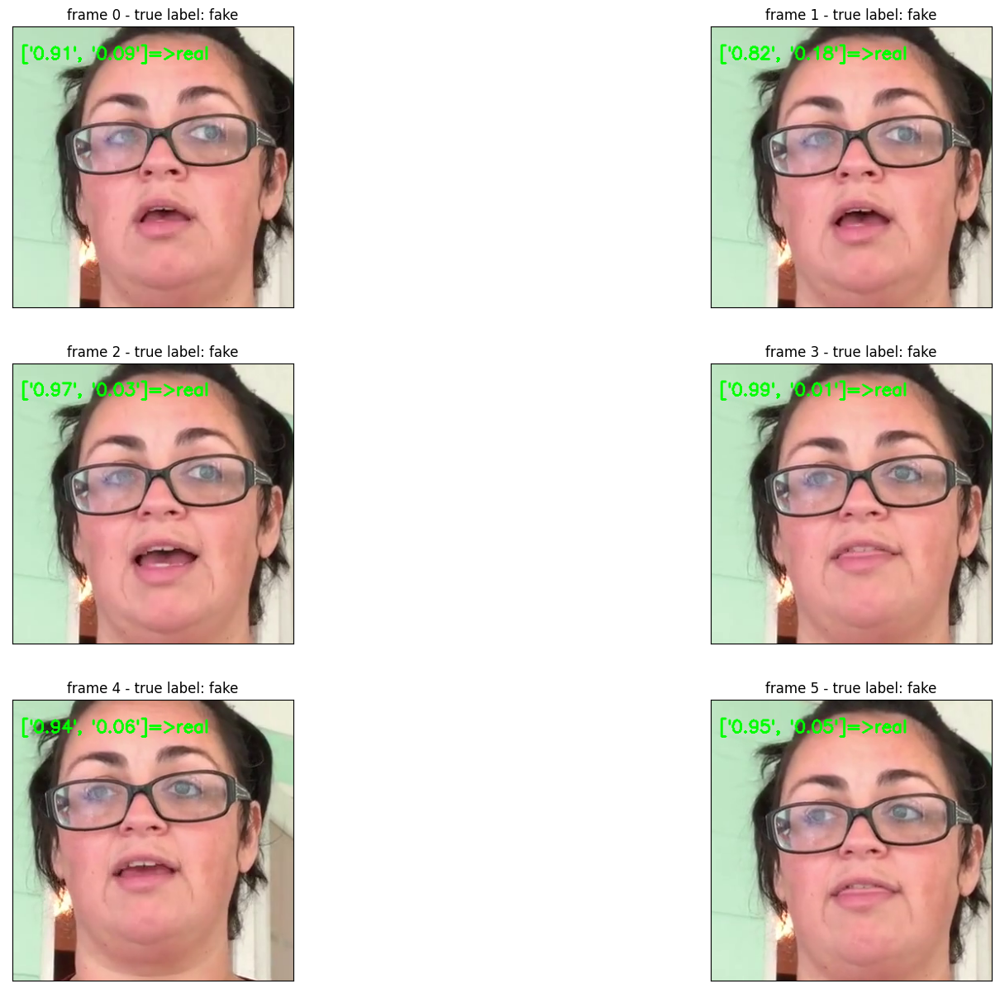

In [37]:
predict_model_with_xception_for_video("video/real1.mp4", model_full_c23)

video/fake1.mp4
300
1 tensor([[0.0551, 0.9449]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.1517, 0.8483]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.0715, 0.9285]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.0152, 0.9848]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.2190, 0.7810]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.0521, 0.9479]], grad_fn=<SoftmaxBackward0>)


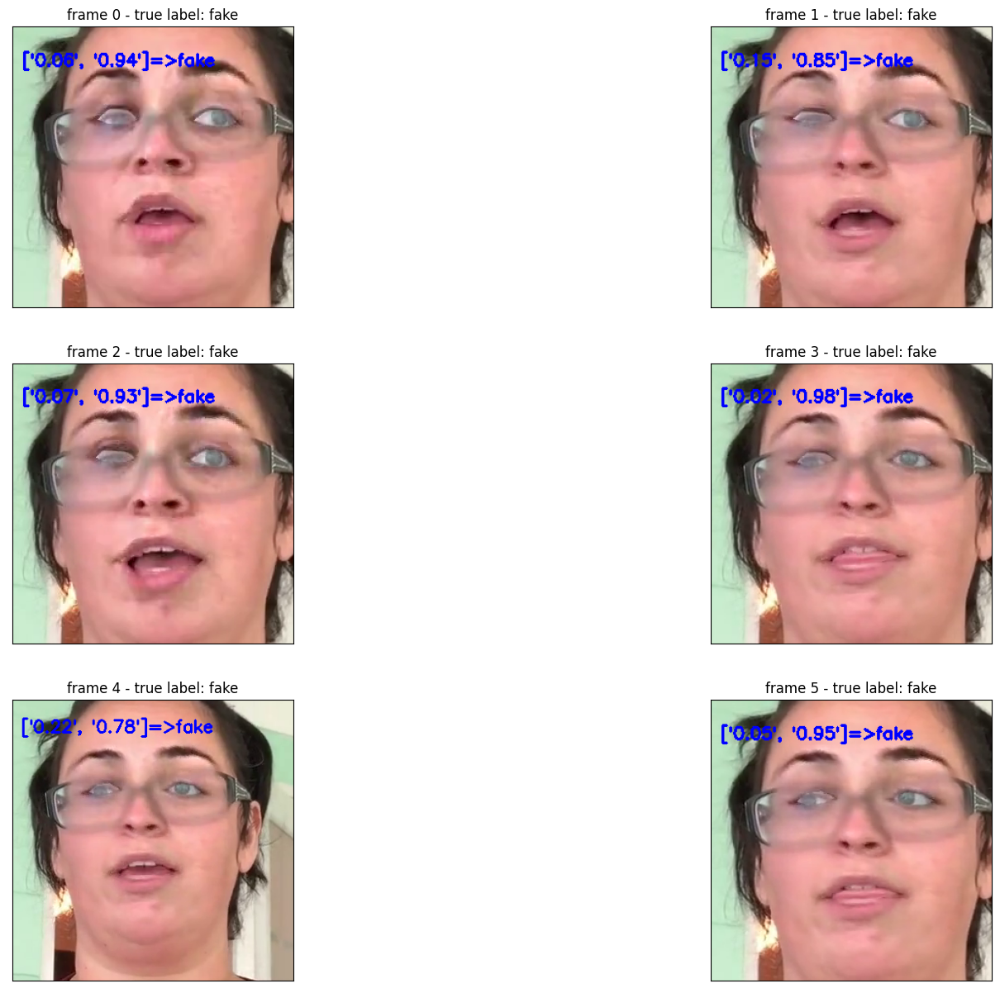

In [38]:
predict_model_with_xception_for_video("video/fake1.mp4", model_full_c23)

video/a6 2-1-Animated.mp4
348
1 tensor([[0.1079, 0.8921]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.0868, 0.9132]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.1175, 0.8825]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.1425, 0.8575]], grad_fn=<SoftmaxBackward0>)
0 tensor([[0.9089, 0.0911]], grad_fn=<SoftmaxBackward0>)
1 tensor([[0.4968, 0.5032]], grad_fn=<SoftmaxBackward0>)


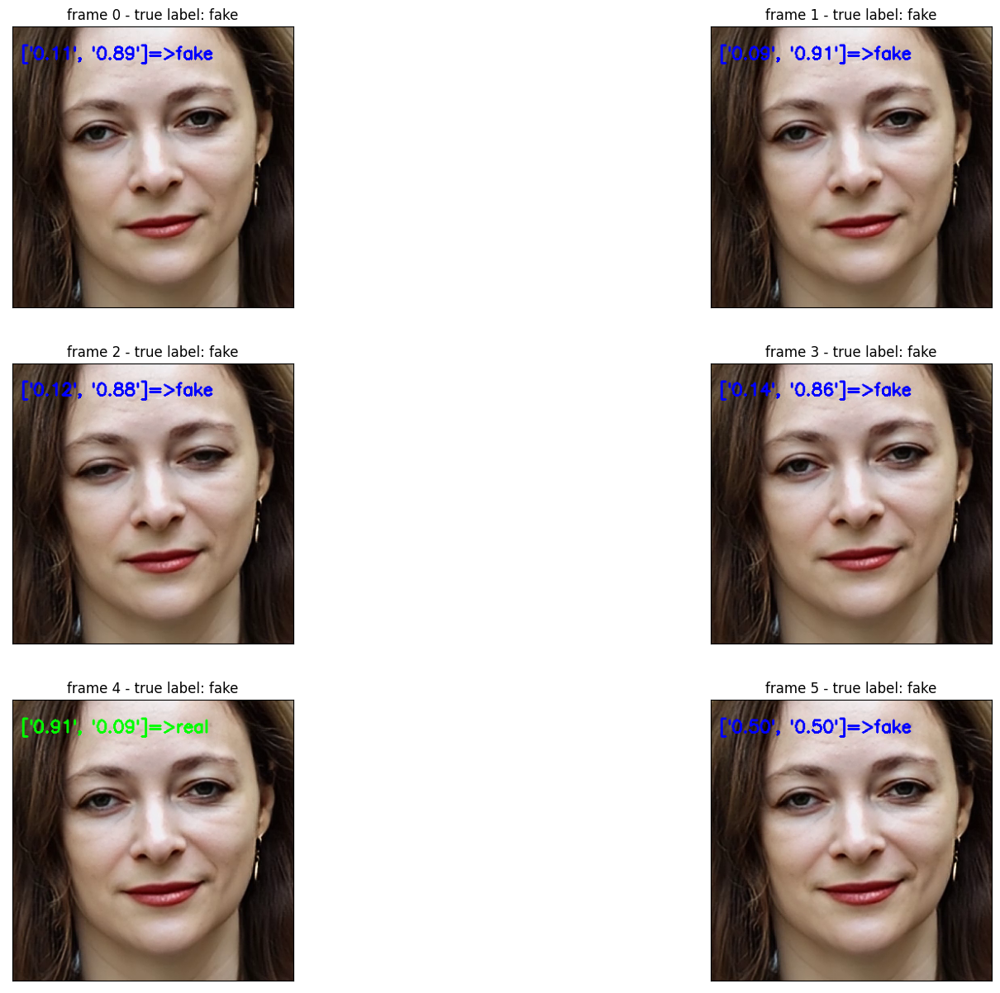

In [39]:
predict_model_with_xception_for_video("video/a6 2-1-Animated.mp4", model_full_c23)

['images/images_for_tests/fake1.jpg', 'images/images_for_tests/fake2.jpg', 'images/images_for_tests/fake3.jpg', 'images/images_for_tests/fake4.jpg', 'images/images_for_tests/real1.jpg', 'images/images_for_tests/real2.jfif']


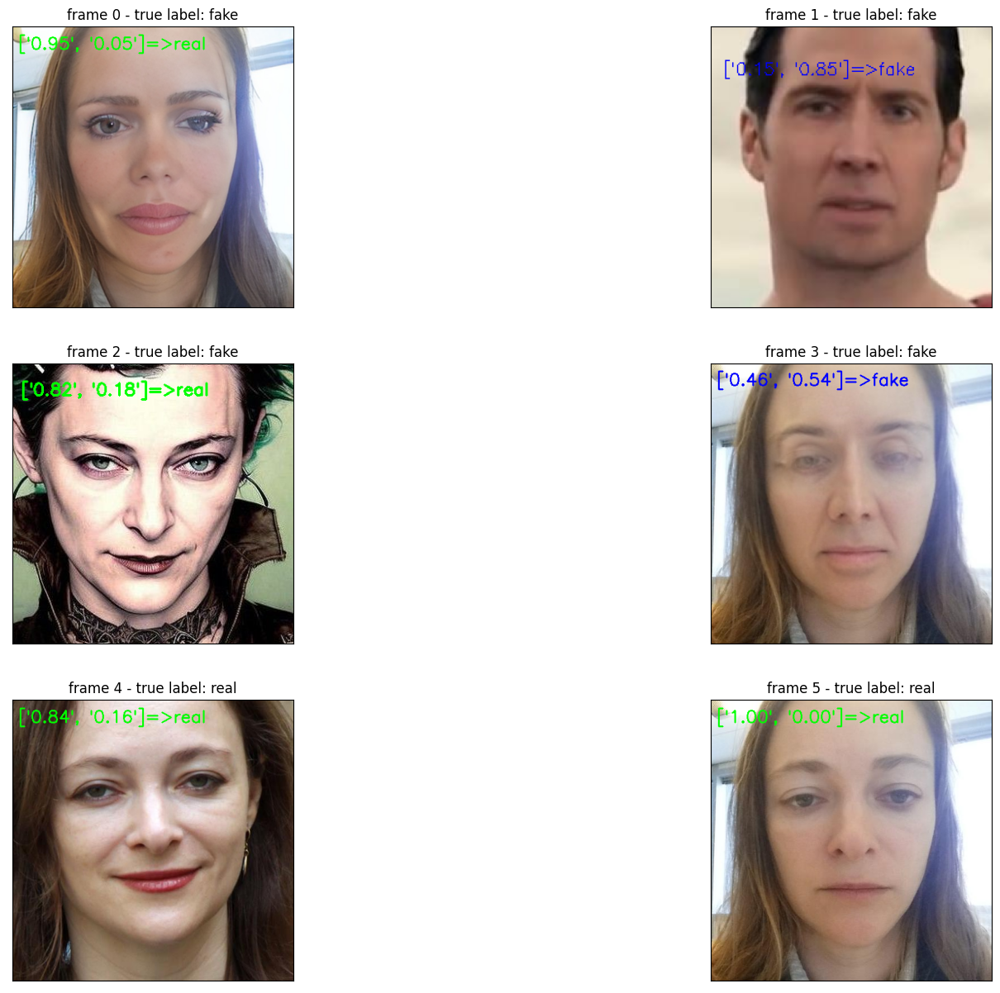

In [40]:
predict_model_with_xception_for_images(model_full_c23)

In [42]:
model_path_full_c40 = 'faceforensics_models/faceforensics++_models_subset/full/xception/full_c40.p'
model_full_c40 = torch.load(model_path_full_c40, map_location=torch.device('cpu'))

In [61]:
def image_resize(image, width = None, height = None, inter = cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]

    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image

    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        r = height / float(h)
        dim = (int(w * r), height)

    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        r = width / float(w)
        dim = (width, int(h * r))

    # resize the image
    resized = cv2.resize(image, dim, interpolation = inter)

    # return the resized image
    return resized

In [108]:
'''
fake =  cv2.imread('./images/images_for_tests/fake4.jpg')
if fake.shape[0]>frame.shape[1]:
    fake=image_resize(fake, height=480)
else:
    fake=image_resize(fake, width=640)
locations = fr.face_locations(fake)    
top, right, bottom, left= locations[0]                        
x1,y1,size_bb = get_boundingbox(left,top,right,bottom,fake.shape[1],fake.shape[0])            
fake_crop = fake[y1:y1+size_bb, x1:x1+size_bb]    
face_image = image_resize(fake_crop,width=framec[y1:y1+size_bb, x1:x1+size_bb].shape[0])
cv2.rectangle(fake, (x1, y1), (x1 + size_bb, y1 + size_bb), color, 2)
plt.imshow( fake) 

'''

"\nfake =  cv2.imread('./images/images_for_tests/fake4.jpg')\nif fake.shape[0]>frame.shape[1]:\n    fake=image_resize(fake, height=480)\nelse:\n    fake=image_resize(fake, width=640)\nlocations = fr.face_locations(fake)    \ntop, right, bottom, left= locations[0]                        \nx1,y1,size_bb = get_boundingbox(left,top,right,bottom,fake.shape[1],fake.shape[0])            \nfake_crop = fake[y1:y1+size_bb, x1:x1+size_bb]    \nface_image = image_resize(fake_crop,width=framec[y1:y1+size_bb, x1:x1+size_bb].shape[0])\ncv2.rectangle(fake, (x1, y1), (x1 + size_bb, y1 + size_bb), color, 2)\nplt.imshow( fake) \n\n"

In [121]:
#create and initialize face detectior object, dlib HOG + LInearSVM is choosen as a backend

#create video captioning object
cap = cv2.VideoCapture(0)
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('demo_df.avi', fourcc, 1.0, (640,  480))

counter=0
score_text=""

top, right, bottom, left = (0,0,0,0)
color = (255,255,255)
prev_encoding=[np.zeros(128)]
fake =  cv2.imread('./images/images_for_tests/fake4.jpg')
if fake.shape[0]>frame.shape[1]:
    fake=image_resize(fake, height=480)
else:
    fake=image_resize(fake, width=640)
locations = fr.face_locations(fake)    
top, right, bottom, left= locations[0]                        
x1,y1,size_bb = get_boundingbox(left,top,right,bottom,fake.shape[1],fake.shape[0])            
fake_crop = fake[y1:y1+size_bb, x1:x1+size_bb]    
    
while True:    
    result, frame = cap.read()   
    frameHeight=frame.shape[0]
    frameWidth= frame.shape[1]
    font_scale = min(frameWidth, frameHeight) * FONT_SCALE
    thickness = math.ceil(min(frameWidth, frameHeight) * THICKNESS_SCALE)
    framec=frame.copy()
    x, y = 10, 40   
    line_num=0
        
    #will be changes if we want to access only some of the frames
    #if(counter % 10==0):
    if(True):
        locations = fr.face_locations(framec)
        if locations:
            top, right, bottom, left= locations[0]                        
            x1,y1,size_bb = get_boundingbox(left,top,right,bottom,frameWidth,frameHeight)            
            if(counter % 10==0 and counter !=0):                
                face_image = image_resize(fake_crop,width=framec[y1:y1+size_bb, x1:x1+size_bb].shape[0])
                #framec[y1:y1+size_bb, x1:x1+size_bb]                
                framec[y1:y1+face_image.shape[0], x1:x1+face_image.shape[1]]=face_image               
            else:
                face_image =framec[y1:y1+size_bb, x1:x1+size_bb]
                
            
            prediction, output = predict_with_model(face_image, model_full_c23,
                                                    cuda=False)
           
            label = 'fake' if prediction == 1 else 'real'
            color = (0, 255, 0) if prediction == 0 else (0, 0, 255)
            output_list = ['{0:.2f}'.format(float(x)) for x in
                           output.detach().cpu().numpy()[0]]
            text = str(output_list)+'=>'+label
            
            #if(counter % 10==0):
            
            encoding = fr.face_encodings(framec)            
            score = 0 if counter==0 else fr.face_distance(prev_encoding,encoding[0])
            score_text = str(score)                
            prev_encoding = encoding  
    
            cv2.rectangle(framec, (x1, y1), (x1 + size_bb, y1 + size_bb), color, 2) 
        else:
            print("no face")
    caption = "Frame {0}:".format(counter)
    cv2.putText(framec, caption, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
    textsize = cv2.getTextSize(text, font_face, font_scale, thickness)[0]   
    line_num+=1
    gap = textsize[1] + 5
    y = y + gap
    x = 10#    
    cv2.putText(framec, text, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
    textsize = cv2.getTextSize(text, font_face, font_scale, thickness)[0]   
    line_num+=1
    gap = textsize[1] + 5
    y = y + gap
    x = 10#    
    cv2.putText(framec, score_text, (x,y),
                        font_face, font_scale,
                        color, thickness, 2)
    
    out.write(framec)
    cv2.imshow("frame", framec) # This will open an independent window
    counter+=1
    if cv2.waitKey(1) & 0xFF==ord('q'): # quit when 'q' is pressed        
        break
        
# close the already opened camera
cap.release() 
out.release()
# Destroy all the windows        
cv2.destroyAllWindows()

In [113]:
cap.release() 
out.release()
# Destroy all the windows        
cv2.destroyAllWindows()